## Segmenter des clients du site d'e-commerce Olist
> L'objectif de ce notebook est de mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse ou non son crédit, puis de classifier la demande de crédit en accordé ou en refusé.

## Plus d'informations
Ce [site](https://www.kaggle.com/c/home-credit-default-risk/data) présente le jeu de données "Home Credit Default Risk".

## Ma bibliothèque personnelle utilisée pour ce projet

In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import outils_ds as ods

## Les bibliothèques utilisées pour ce projet

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as st
#import yellowbrick
import time
import xgboost as xgb
import lightgbm as lgb
import re
import shap
import sklearn
import pickle
plt.style.use('seaborn')
sns.set_style('whitegrid')
sns.set_context("notebook")
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
pd.options.display.max_rows = 999
pd.options.display.max_columns = 999
pd.set_option('mode.chained_assignment', None)

In [4]:
from sklearn.decomposition import PCA 
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.dummy import DummyClassifier
from xgboost import XGBClassifier
from xgboost import plot_importance
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV, cross_val_predict
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import roc_auc_score
from sklearn.metrics import make_scorer

In [5]:
from imblearn.under_sampling import RandomUnderSampler 

## Les 8 tableaux de données :

In [6]:
application_train = pd.read_csv('../fichier_csv/application_train.csv')
application_test= pd.read_csv('../fichier_csv/application_test.csv')
bureau = pd.read_csv('../fichier_csv/bureau.csv')
bureau_balance = pd.read_csv('../fichier_csv/bureau_balance.csv')
POS_CASH_balance = pd.read_csv('../fichier_csv/POS_CASH_balance.csv')
credit_card_balance = pd.read_csv('../fichier_csv/credit_card_balance.csv')
previous_application = pd.read_csv('../fichier_csv/previous_application.csv')
installments_payments = pd.read_csv('../fichier_csv/installments_payments.csv')

In [7]:
application_train.head()
application_test.head()
bureau.head()
bureau_balance.head()
POS_CASH_balance.head()
credit_card_balance.head()
previous_application.head()
installments_payments.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


On s'interesse seulement à `application_train` :

## fonctions utilisées

In [8]:
def type_features(data):
    categorical_features = data.select_dtypes(include = ["object"]).columns
    numerical_features = data.select_dtypes(exclude = ["object"]).columns
    print( "categorical_features :",categorical_features)
    print(len(categorical_features))
    print('-----'*40)
    print("numerical_features:",numerical_features)
    print(len(numerical_features))

In [9]:
def missingdata(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    ms=pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    ms= ms[ms["Percent"] > 0]
    f,ax =plt.subplots(figsize=(15,10))
    plt.xticks(rotation='90')
    fig=sns.barplot(ms.index, ms["Percent"],color="green",alpha=0.8)
    plt.xlabel('Features', fontsize=15)
    plt.ylabel('Percent of missing values', fontsize=15)
    plt.title('Percent missing data by feature', fontsize=15)
    #ms= ms[ms["Percent"] > 0]
    return ms

In [10]:
def feat_ext_source(df):
    x1 = df['EXT_SOURCE_1'].fillna(-1) + 1e-1
    x2 = df['EXT_SOURCE_2'].fillna(-1) + 1e-1
    x3 = df['EXT_SOURCE_3'].fillna(-1) + 1e-1
    
    df['EXT_SOURCE_1over2_NAminus1_Add0.1'] = x1/x2
    df['EXT_SOURCE_2over1_NAminus1_Add0.1'] = x2/x1
    df['EXT_SOURCE_1over3_NAminus1_Add0.1'] = x1/x3
    df['EXT_SOURCE_3over1_NAminus1_Add0.1'] = x3/x1
    df['EXT_SOURCE_2over3_NAminus1_Add0.1'] = x2/x3
    df['EXT_SOURCE_3over2_NAminus1_Add0.1'] = x3/x2
    
    df['EXT_SOURCE_na1_2'] = (df['EXT_SOURCE_1'].isnull()) * (df['EXT_SOURCE_2'].fillna(0))
    df['EXT_SOURCE_na1_3'] = (df['EXT_SOURCE_1'].isnull()) * (df['EXT_SOURCE_3'].fillna(0))
    df['EXT_SOURCE_na2_1'] = (df['EXT_SOURCE_2'].isnull()) * (df['EXT_SOURCE_1'].fillna(0))
    df['EXT_SOURCE_na2_3'] = (df['EXT_SOURCE_2'].isnull()) * (df['EXT_SOURCE_3'].fillna(0))
    df['EXT_SOURCE_na3_1'] = (df['EXT_SOURCE_3'].isnull()) * (df['EXT_SOURCE_1'].fillna(0))
    df['EXT_SOURCE_na3_2'] = (df['EXT_SOURCE_3'].isnull()) * (df['EXT_SOURCE_2'].fillna(0))
    
    df['CREDIT_LENGTH'] = df['AMT_CREDIT'] / df['AMT_ANNUITY']
    
    return df

In [11]:
def cat_to_dummy(train):
    train_d = pd.get_dummies(train, drop_first=False)
    return train_d

In [12]:
def print_errors(title, accuracy, recall, precision, f1, roc, perso):
    print(title)
    print(len(title)*'-')
    print('Errors :\n * accuracy = {}\n * recall = {}\n * precision = {}\n * f1 = {}\n * roc_score = {}, \n * perso_score = {}'.format(accuracy, recall, precision, f1, roc, perso))
    print('\n')

In [13]:
def baselineModel(X_test, y_test):
    start_time = time.time()
    title = 'Baseline Model'
    baseline_value = np.random.randint(2, size=len(X_test))
    X_test['baseline prediction']=baseline_value
    print('Le temps d\'exécution pour l\'entraînement du modèle : {} est de : {} s'.format(title, round(time.time()-start_time, 2)))
    
    conf_matrix = confusion_matrix(y_test, X_test['baseline prediction'])
    print(conf_matrix)
    f,ax=plt.subplots(figsize=(10,7))
    _=sns.heatmap(conf_matrix, cmap='YlGnBu', annot=True, fmt="d")
    _=plt.title(title, weight='bold', fontsize=18)
    _=plt.ylabel('True label')
    _=plt.xlabel('Predicted label')
    plt.show()
    
    accuracy = accuracy_score(y_test, X_test['baseline prediction'])
    recall = recall_score(y_test, X_test['baseline prediction'])
    precision = precision_score(y_test, X_test['baseline prediction'])
    f1 = f1_score(y_test, X_test['baseline prediction'], average='binary')
    roc = roc_auc_score(y_test, X_test['baseline prediction'])
    perso = persoMetric(y_test, X_test['baseline prediction'])

    print_errors(title, accuracy, recall, precision, f1, roc, perso)
    dict_predictions = {'baseline': X_test['baseline prediction']}
    
    del X_test['baseline prediction']
    return dict_predictions

In [14]:
def testModel(model, reg, dict_predictions, X_train, y_train, X_test, y_test):
    start_time = time.time()
    reg_fit = reg.fit(X_train, y_train)
    y_pred = reg.predict(X_test)
    print('Le temps d\'exécution du modèle {} est de : {} s'.format(model, round(time.time()-start_time, 2)))

    
    conf_matrix = confusion_matrix(y_test, y_pred)
    print(conf_matrix)
    f,ax=plt.subplots(figsize=(10,7))
    _=sns.heatmap(conf_matrix, cmap='YlGnBu', annot=True, fmt="d")
    _=plt.title(model, weight='bold', fontsize=18)
    _=plt.ylabel('True label')
    _=plt.xlabel('Predicted label')
    plt.show()
    
    dict_predictions[model] = y_pred
    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc = roc_auc_score(y_test, y_pred)
    perso = persoMetric(y_test, y_pred)
    print_errors(model, accuracy, recall, precision, f1, roc, perso)
    f,ax=plt.subplots(figsize=(10,10))
    roc_c = RocCurveDisplay.from_estimator(reg_fit, X_test, y_test, ax=ax)
    plt.show()
    print(150*'-')

In [15]:
def persoMetric(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel() # on récupère les 4 valeurs de la matrice
   
    tn_weight = 1
    fp_weight = 0
    fn_weight = -5
    tp_weight = 0

    # Les vrais positifs et les faux positifs n'ont pas beaucoup d'importance pour nous
    # De plus, nous voulons pénaliser les faux négatifs mais dire oui aux vrais négatifs
    gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)
   
    # Le meilleur scénario est celui où il n'a pas de faux négatifs ou de faux positifs
    best = (tn + fp) * tn_weight + (tp + fn) * tp_weight
   
    # Le modèle de base est un modèle naïf qui prédit que tout le monde n'est pas négatif
    # Tout les vrais positifs et les faux négatifs seront incorrectement montrés comme négatifs
    baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight
   
    score = (gain - baseline) / (best - baseline)
   
    return score  

In [16]:
def persoMetric2(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel() # on récupère les 4 valeurs de la matrice
   
    tn_weight = 1
    fp_weight = 0
    fn_weight = -10
    tp_weight = 0

    # Les vrais positifs et les faux positifs n'ont pas beaucoup d'importance pour nous
    # De plus, nous voulons pénaliser les faux négatifs mais dire oui aux vrais négatifs
    gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)
   
    # Le meilleur scénario est celui où il n'a pas de faux négatifs ou de faux positifs
    best = (tn + fp) * tn_weight + (tp + fn) * tp_weight
   
    # Le modèle de base est un modèle naïf qui prédit que tout le monde n'est pas négatif
    # Tout les vrais positifs et les faux négatifs seront incorrectement montrés comme négatifs
    baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight
   
    score = (gain - baseline) / (best - baseline)
   
    return score  

## Etude du dataset (avec suppression des NaNs)

### Nettoyage du dataset

In [17]:
application_train_wn = application_train.copy()

In [18]:
print("The number of Features in application train dataset :",application_train_wn.shape[1])
print("The number of Rows in application Train dataset :",application_train_wn.shape[0])

The number of Features in application train dataset : 122
The number of Rows in application Train dataset : 307511


In [19]:
type_features(application_train_wn)

categorical_features : Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')
16
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
numerical_features: Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'A

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


,Total,Percent
COMMONAREA_MEDI,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
FONDKAPREMONT_MODE,210295,68.386172
LIVINGAPARTMENTS_MODE,210199,68.354953
LIVINGAPARTMENTS_AVG,210199,68.354953
LIVINGAPARTMENTS_MEDI,210199,68.354953


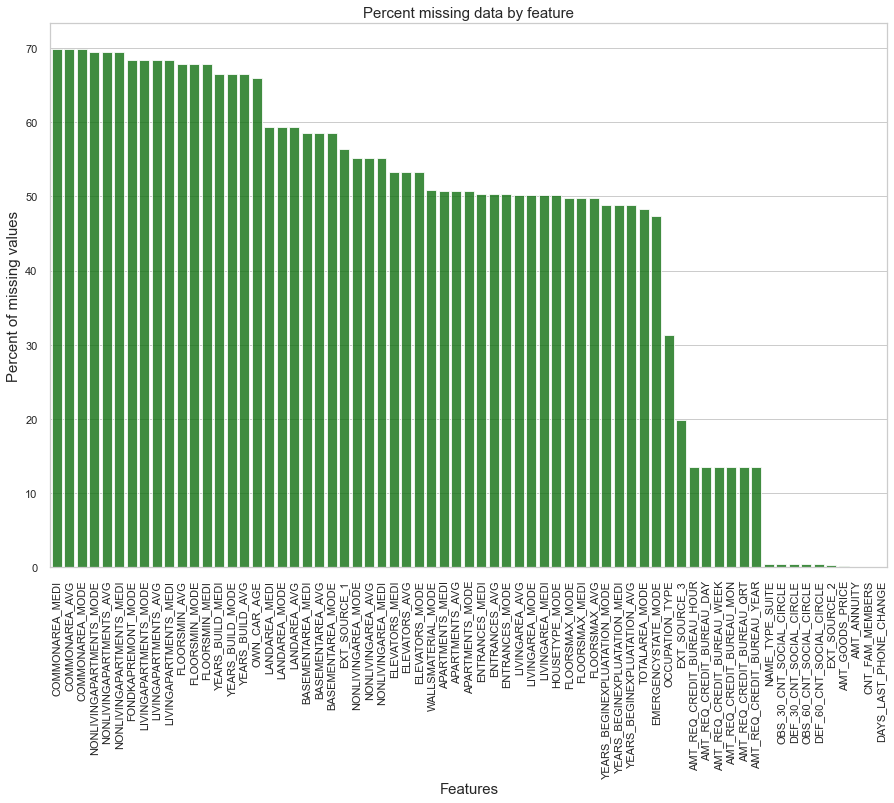

In [20]:
missingdata(application_train_wn)

In [21]:
cols_cibles_atrain = ods.printFullColumns(application_train_wn, 0.15, keep_cols = [])

['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 

In [22]:
application_train_wn[cols_cibles_atrain].describe(include='all')

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,306219,307511,307511,307511,307511,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511,3.068510e+05,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,NaN,7,8,5,6,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,NaN,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TUESDAY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Business Entity Type 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,NaN,248526,158774,218391,196432,272868,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,NaN,NaN,NaN,NaN,NaN,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,NaN,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,NaN,5.143927e-01,1.422245,0.143421,1.405292,0.100049,-962.858788,0.000042,0.710023,0.000081,0.015115,0.088055,0.000192,0.081376,0.003896,0.000023,0.003912,0.000007,0.003525,0.002936,0.00121,0.009928,0.000267,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,NaN,NaN,NaN,NaN,NaN,0.013831,4363.988632,141275.766519,3522.886321

Taille du tableau avant le nettoyage (307511, 122)
Taille du tableau après le drop (307511, 122)
Taille du tableau après le nettoyage (307511, 71)
 51 colonnes supprimées et 0 lignes supprimées
Les colonnes supprimées sont : {'LANDAREA_MODE', 'EXT_SOURCE_1', 'BASEMENTAREA_AVG', 'YEARS_BUILD_MODE', 'LIVINGAREA_MEDI', 'NONLIVINGAREA_MODE', 'BASEMENTAREA_MODE', 'YEARS_BUILD_AVG', 'APARTMENTS_MEDI', 'COMMONAREA_MODE', 'LIVINGAPARTMENTS_MEDI', 'FLOORSMIN_AVG', 'COMMONAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'APARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'TOTALAREA_MODE', 'ELEVATORS_AVG', 'LIVINGAREA_AVG', 'ENTRANCES_AVG', 'ELEVATORS_MEDI', 'ENTRANCES_MODE', 'FLOORSMAX_MEDI', 'YEARS_BUILD_MEDI', 'EMERGENCYSTATE_MODE', 'OCCUPATION_TYPE', 'LANDAREA_AVG', 'ENTRANCES_MEDI', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MEDI', 'OWN_CAR_AGE', 'ELEVATORS_MODE', 'APARTMENTS_MODE', 'FLOORSMAX_MODE', 'FONDKAPREMONT_MODE', 'BASEMENTAREA_MEDI', 'FLOORSMIN_MEDI', 'EXT_SOURCE_3', 'COMMONARE

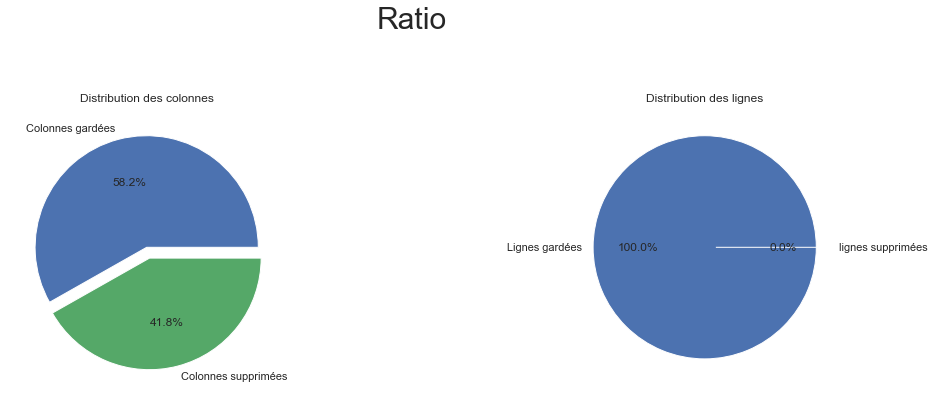

In [23]:
mask = None
plt.rc('figure', figsize=[15, 7])
application_train_clean = ods.cleanData(application_train_wn, 0.15, mask)
print("Les colonnes supprimées sont : {}".format(set(application_train_wn.columns)-set(application_train_clean.columns)))

In [24]:
application_train_clean = application_train_clean.loc[application_train_clean['SK_ID_CURR'] != 114967]

In [25]:
application_train_clean = application_train_clean[application_train_clean['AMT_INCOME_TOTAL'] != 1.170000e+08]
application_train_clean = application_train_clean[application_train_clean['AMT_REQ_CREDIT_BUREAU_QRT'] != 261]
application_train_clean = application_train_clean[application_train_clean['OBS_30_CNT_SOCIAL_CIRCLE'] < 300]

In [26]:
application_train_clean['DAYS_EMPLOYED'] = (application_train_clean['DAYS_EMPLOYED'].apply(lambda x: x if x != 365243 else np.nan))

In [27]:
for col in application_train_clean.select_dtypes(include=['object']).columns:
    if application_train_clean[col].isna().sum() != 0:
        print(col)
    else :
        continue

NAME_TYPE_SUITE


In [28]:
application_train_clean['NAME_TYPE_SUITE'].fillna(application_train_clean['NAME_TYPE_SUITE'].mode()[0], inplace=True)

In [29]:
application_train_clean[application_train_clean['NAME_TYPE_SUITE'].isna()==True]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


In [30]:
for col in application_train_clean.select_dtypes(include=['float64', 'int64']).columns:
    if application_train_clean[col].isna().sum() != 0:
        print(col)
    else :
        continue

AMT_ANNUITY
AMT_GOODS_PRICE
DAYS_EMPLOYED
CNT_FAM_MEMBERS
EXT_SOURCE_2
DAYS_LAST_PHONE_CHANGE
AMT_REQ_CREDIT_BUREAU_HOUR
AMT_REQ_CREDIT_BUREAU_DAY
AMT_REQ_CREDIT_BUREAU_WEEK
AMT_REQ_CREDIT_BUREAU_MON
AMT_REQ_CREDIT_BUREAU_QRT
AMT_REQ_CREDIT_BUREAU_YEAR


In [31]:
for col in application_train_clean.select_dtypes(include=['float64', 'int64']).columns:
    if application_train_clean[col].isna().sum() != 0:
        application_train_clean[col].fillna(application_train_clean[col].median(), inplace=True)
    else :
        continue

##### Valeurs aberrantes

In [32]:
pca = PCA(n_components = 2) 
application_train_clean_pca = pca.fit_transform(application_train_clean.select_dtypes(include=['float64', 'int64'])) 
application_train_clean_pca = pd.DataFrame(application_train_clean_pca) 
application_train_clean_pca.columns = ['P1', 'P2'] 
print(application_train_clean_pca.head()) 

              P1             P2
0 -265830.852955 -173863.471391
1  915800.700688 -175071.491537
2 -621022.711963 -181836.811691
3 -375959.592837 -178152.425356
4  -84269.462974 -180603.474707


<Figure size 1152x720 with 0 Axes>

<AxesSubplot:xlabel='P1', ylabel='P2'>

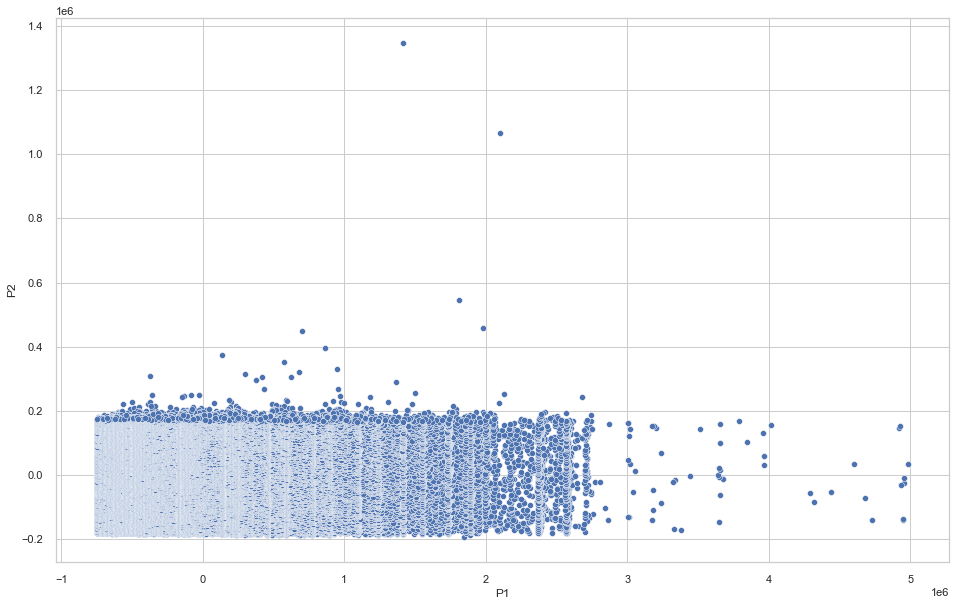

In [33]:
plt.figure(figsize=(16,10))
sns.scatterplot(data=application_train_clean_pca, x='P1', y='P2')

In [34]:
application_train_clean_full = cat_to_dummy(application_train_clean)

---

## Manipulations dataset pour streamlit

In [35]:
application_train_clean_full_st = application_train_clean_full.copy()

In [36]:
application_train_clean_full_st['AGE'] = round(application_train_clean_full_st['DAYS_BIRTH']/(-365.25))

In [37]:
application_train_clean_full_st['LABEL_AGE'] = ''

In [38]:
for i,n in application_train_clean_full_st['AGE'].iteritems():
    if 20<n<=30:
        application_train_clean_full_st['LABEL_AGE'].loc[i] = '20-30'
    if 30<n<=40:
        application_train_clean_full_st['LABEL_AGE'].loc[i] = '30-40'
    if 40<n<=50:
        application_train_clean_full_st['LABEL_AGE'].loc[i] = '40-50'
    if 50<n<=60:
        application_train_clean_full_st['LABEL_AGE'].loc[i] = '50-60'
    if 60<n<=70:
        application_train_clean_full_st['LABEL_AGE'].loc[i] = '60-70'

In [39]:
application_train_clean_full_st = application_train_clean_full_st.sample(n = 1000, random_state = 42)

In [40]:
application_train_clean_full_st.shape

(1000, 168)

In [41]:
application_train_clean_full_st.to_csv('dataframe_st.csv', index = 'False')

---

#### Etude de la variable `TARGET`

In [40]:
X_atcf, y_atcf = (application_train_clean_full.drop(['SK_ID_CURR', 'TARGET'], axis=1),application_train_clean_full['TARGET'])

<AxesSubplot:xlabel='TARGET', ylabel='count'>

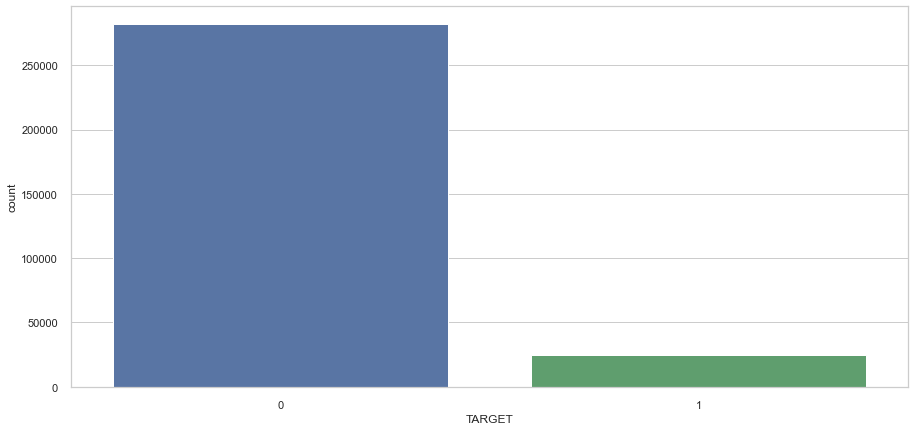

In [41]:
sns.countplot(x = y_atcf)

Au vu de la prédominance du "0", nous allons utilisé une méthode de rebalancing :

In [42]:
undersample = RandomUnderSampler(sampling_strategy=0.5)

In [43]:
X_atcf_us, y_atcf_us = undersample.fit_resample(X_atcf, y_atcf)

<AxesSubplot:xlabel='TARGET', ylabel='count'>

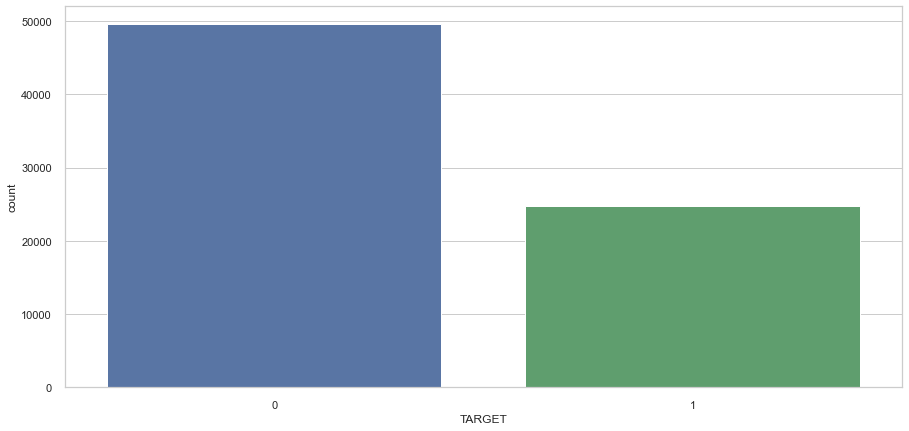

In [44]:
sns.countplot(x = y_atcf_us)

### Modélisations

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X_atcf_us, y_atcf_us, test_size=0.20, random_state=42, stratify=y_atcf_us)

In [46]:
X_test = X_test.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [47]:
X_train = X_train.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [48]:
dict_models = {'Dummy': DummyClassifier(strategy = 'stratified', random_state=42),
                'Random Forest': RandomForestClassifier(random_state=42),
               'Regression logistique': LogisticRegression(solver = 'liblinear', max_iter = 1000, random_state=42),
               'XGBoost': XGBClassifier(random_state = 42, use_label_encoder=False, eval_metric = 'error'),
              'LightGBM' : LGBMClassifier(random_state=42),
              'knn' : KNeighborsClassifier(n_neighbors=5)}

Le temps d'exécution pour l'entraînement du modèle : Baseline Model est de : 0.0 s
[[4916 4999]
 [2496 2462]]


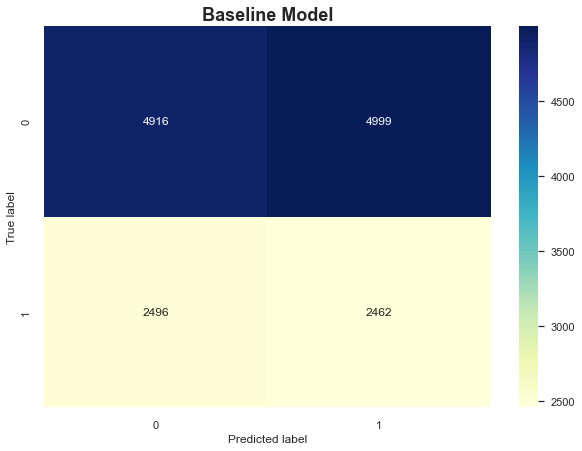

Baseline Model
--------------
Errors :
 * accuracy = 0.4960666980434344
 * recall = 0.4965711980637354
 * precision = 0.32998257606219006
 * f1 = 0.3964892503422176
 * roc_score = 0.4961928103278838, 
 * perso_score = 0.29491730536506655




In [49]:
dict_predictions_baseModel = baselineModel(X_test, y_test)

Le temps d'exécution du modèle Dummy est de : 0.0 s
[[6666 3249]
 [3331 1627]]


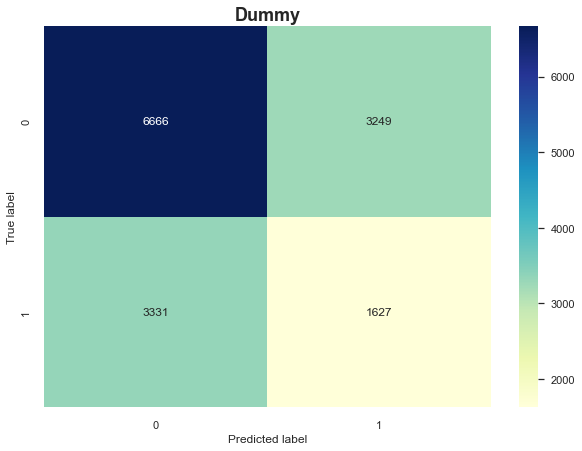

Dummy
-----
Errors :
 * accuracy = 0.5575875747999731
 * recall = 0.3281565147236789
 * precision = 0.3336751435602953
 * f1 = 0.3308928208257067
 * roc_score = 0.5002355947294642, 
 * perso_score = 0.19709560306575233




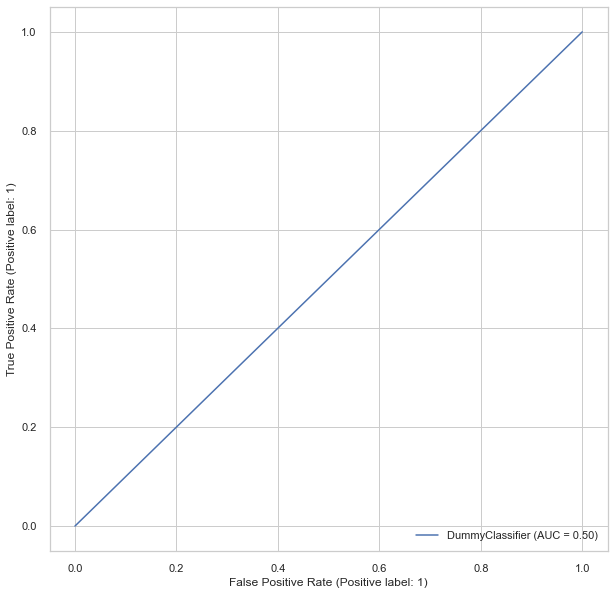

------------------------------------------------------------------------------------------------------------------------------------------------------
Le temps d'exécution du modèle Random Forest est de : 15.89 s
[[9136  779]
 [3648 1310]]


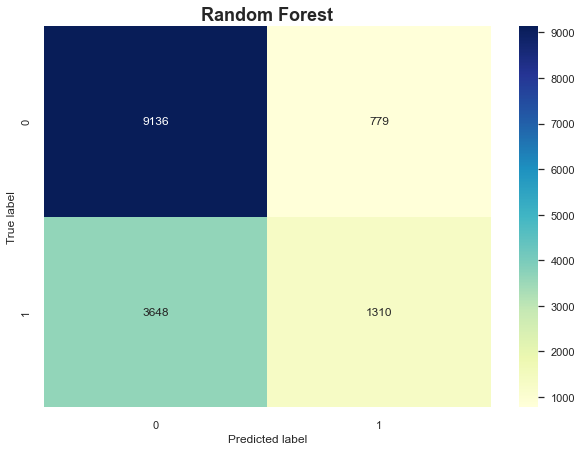

Random Forest
-------------
Errors :
 * accuracy = 0.702346533987763
 * recall = 0.26421944332392094
 * precision = 0.627094303494495
 * f1 = 0.3717894139350078
 * roc_score = 0.5928258083992272, 
 * perso_score = 0.23279548204921338




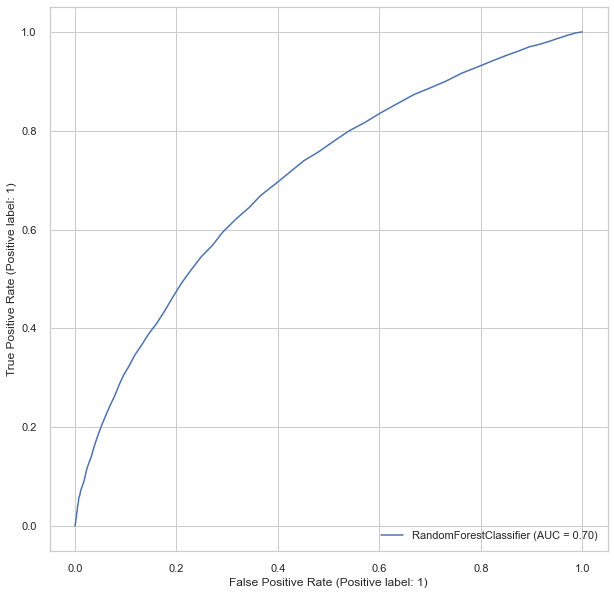

------------------------------------------------------------------------------------------------------------------------------------------------------
Le temps d'exécution du modèle Regression logistique est de : 1.0 s
[[9798  117]
 [4787  171]]


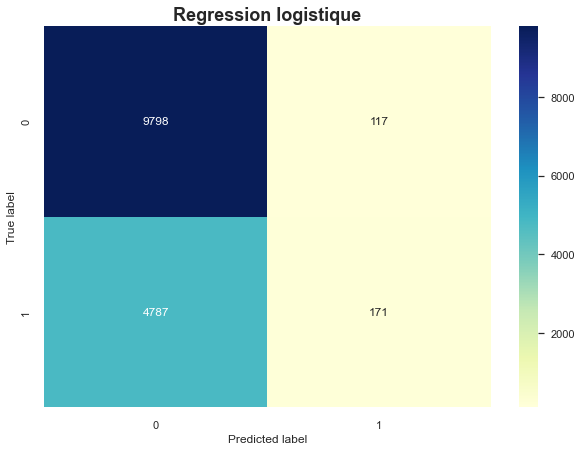

Regression logistique
---------------------
Errors :
 * accuracy = 0.6702749949573051
 * recall = 0.03448971359419121
 * precision = 0.59375
 * f1 = 0.06519252764010676
 * roc_score = 0.5113447055111653, 
 * perso_score = 0.029770068576038724




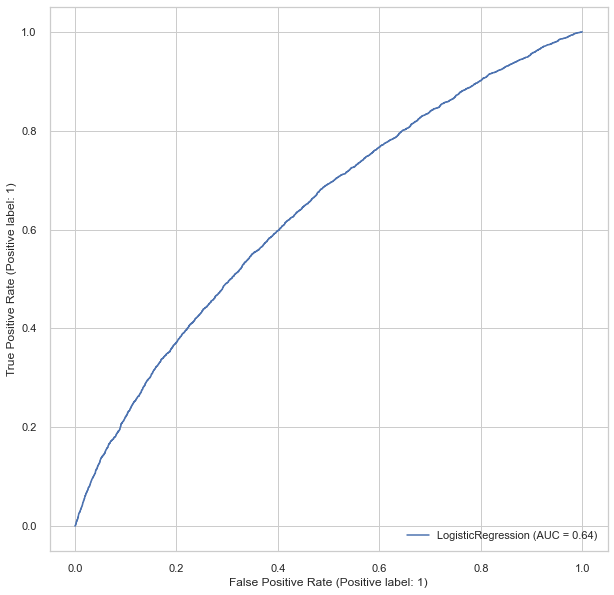

------------------------------------------------------------------------------------------------------------------------------------------------------
Le temps d'exécution du modèle XGBoost est de : 7.92 s
[[8748 1167]
 [3137 1821]]


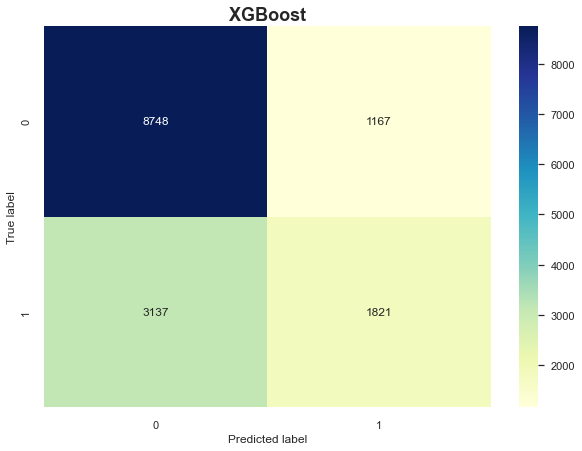

XGBoost
-------
Errors :
 * accuracy = 0.710616553486183
 * recall = 0.3672851956434046
 * precision = 0.6094377510040161
 * f1 = 0.45834382079033475
 * roc_score = 0.6247923708928066, 
 * perso_score = 0.32020976200080675




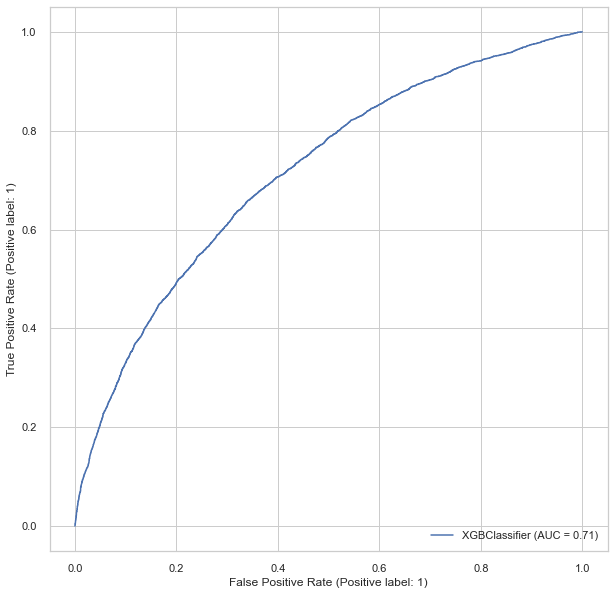

------------------------------------------------------------------------------------------------------------------------------------------------------
Le temps d'exécution du modèle LightGBM est de : 0.77 s
[[8878 1037]
 [3243 1715]]


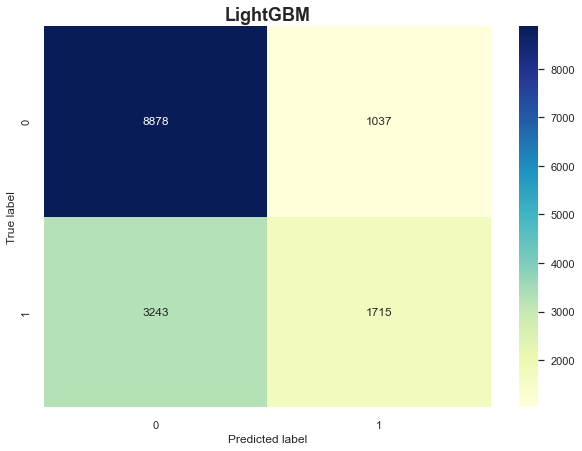

LightGBM
--------
Errors :
 * accuracy = 0.7122302158273381
 * recall = 0.34590560709963697
 * precision = 0.6231831395348837
 * f1 = 0.4448767833981842
 * roc_score = 0.6206583002719567, 
 * perso_score = 0.3040742234772085




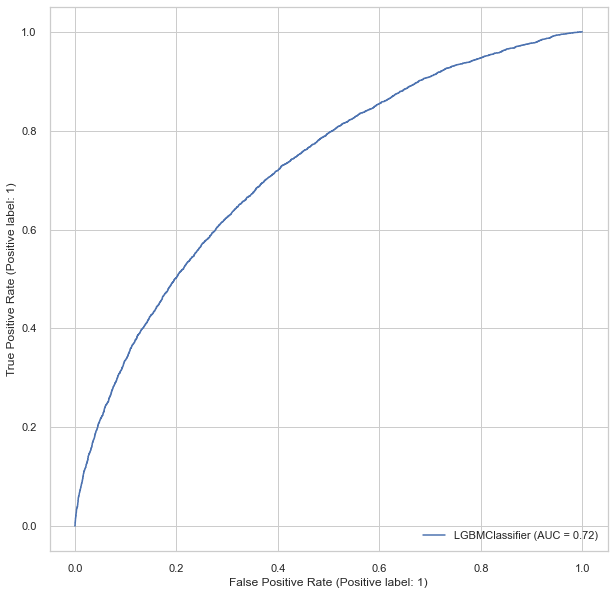

------------------------------------------------------------------------------------------------------------------------------------------------------
Le temps d'exécution du modèle knn est de : 15.73 s
[[7761 2154]
 [3374 1584]]


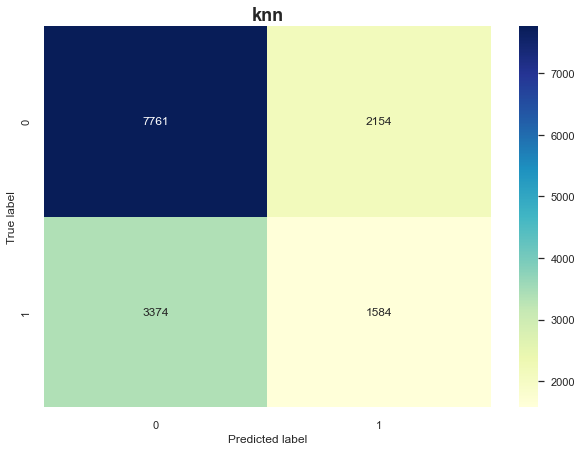

knn
---
Errors :
 * accuracy = 0.6283197740872722
 * recall = 0.3194836627672449
 * precision = 0.42375601926163725
 * f1 = 0.36430542778288866
 * roc_score = 0.5511185333503394, 
 * perso_score = 0.2325937878176684




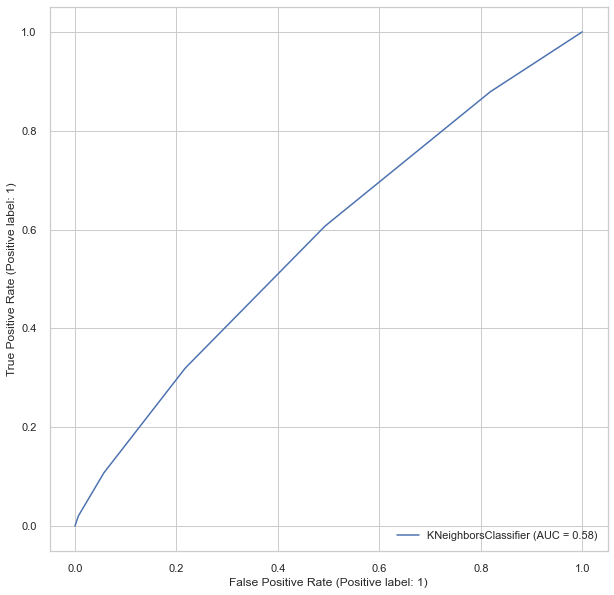

------------------------------------------------------------------------------------------------------------------------------------------------------


In [50]:
for model, reg in dict_models.items():
    testModel(model, reg, dict_predictions_baseModel, X_train, y_train, X_test, y_test)

A ce stade, les algorithmes XGBoost et LightGBM ont des scores similaires mais on constate que LighGBM s'exécute en 6 fois moins de temps que XGBoost

## Etude du dataset (sans suppression des NaNs)

In [51]:
application_train_woutn = application_train.copy()

In [52]:
application_train_woutn = application_train_woutn[application_train_woutn['AMT_INCOME_TOTAL'] != 1.170000e+08]
application_train_woutn = application_train_woutn[application_train_woutn['AMT_REQ_CREDIT_BUREAU_QRT'] != 261]
application_train_woutn = application_train_woutn[application_train_woutn['OBS_30_CNT_SOCIAL_CIRCLE'] < 300]

In [53]:
application_train_woutn = feat_ext_source(application_train_woutn)

In [54]:
application_train_woutn_full = cat_to_dummy(application_train_woutn)

In [55]:
X_atwf, y_atwf = (application_train_clean_full.drop(['SK_ID_CURR', 'TARGET'], axis=1),application_train_woutn_full['TARGET'])

In [56]:
X_atwf_us, y_atwf_us = undersample.fit_resample(X_atwf, y_atwf)

### Modélisations

In [57]:
X_train_w, X_test_w, y_train_w, y_test_w = train_test_split(X_atwf_us, y_atwf_us, test_size=0.20, random_state=42, stratify=y_atwf_us)

In [58]:
X_train_w = X_train_w.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [59]:
X_test_w = X_test_w.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

Le temps d'exécution pour l'entraînement du modèle : Baseline Model est de : 0.0 s
[[4935 4980]
 [2419 2539]]


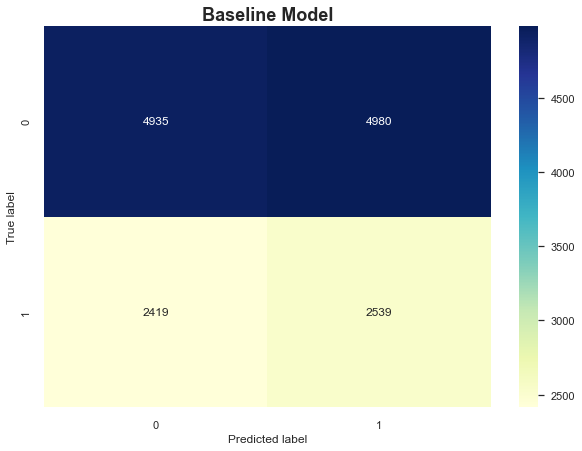

Baseline Model
--------------
Errors :
 * accuracy = 0.5025213474080549
 * recall = 0.5121016538926987
 * precision = 0.3376778826971672
 * f1 = 0.40698885950148267
 * roc_score = 0.5049161824682857, 
 * perso_score = 0.31121419927390076




In [60]:
dict_predictions_baseModel = baselineModel(X_test_w, y_test_w)

Le temps d'exécution du modèle Dummy est de : 0.0 s
[[6666 3249]
 [3331 1627]]


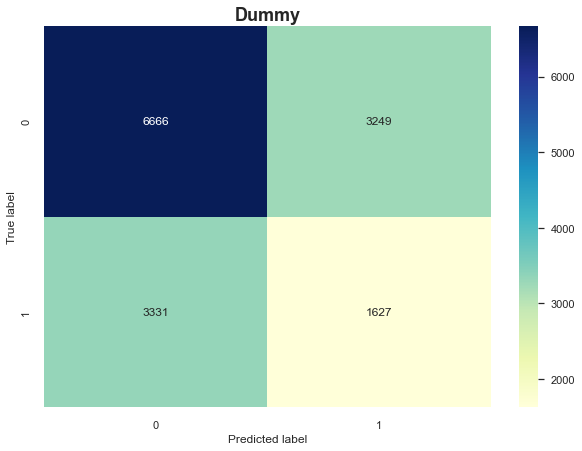

Dummy
-----
Errors :
 * accuracy = 0.5575875747999731
 * recall = 0.3281565147236789
 * precision = 0.3336751435602953
 * f1 = 0.3308928208257067
 * roc_score = 0.5002355947294642, 
 * perso_score = 0.19709560306575233




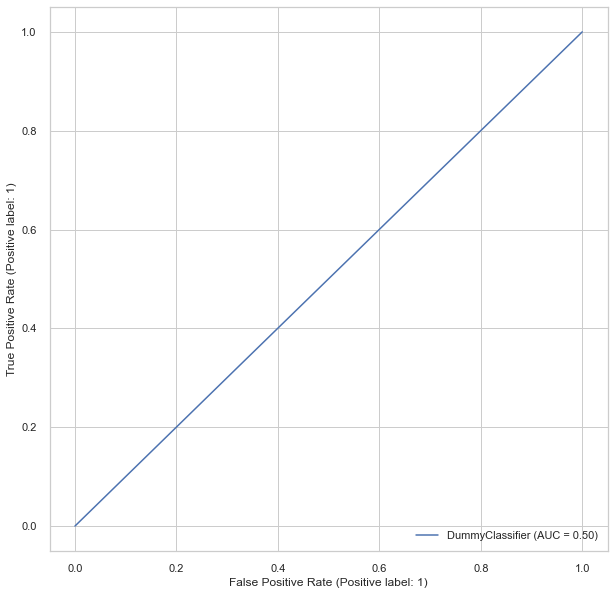

------------------------------------------------------------------------------------------------------------------------------------------------------
Le temps d'exécution du modèle Random Forest est de : 15.26 s
[[9164  751]
 [3675 1283]]


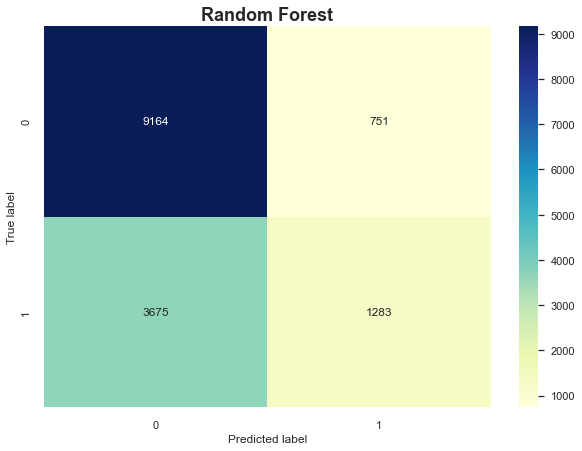

Random Forest
-------------
Errors :
 * accuracy = 0.7024137699186446
 * recall = 0.25877369907220654
 * precision = 0.6307767944936087
 * f1 = 0.3669908466819222
 * roc_score = 0.5915149382905157, 
 * perso_score = 0.22847922549415087




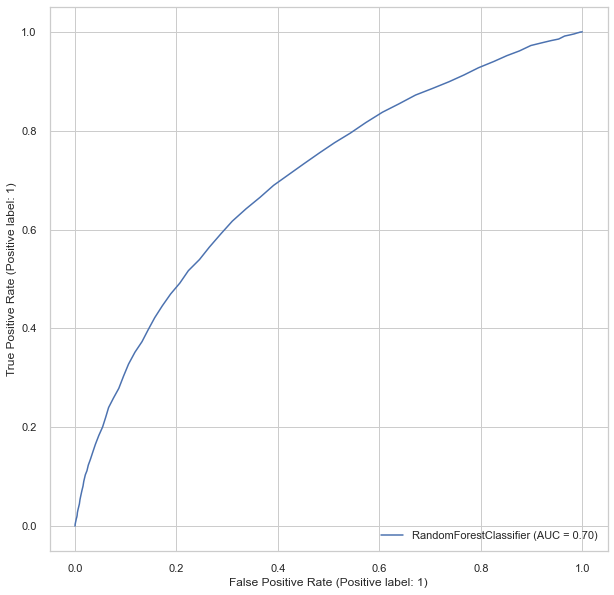

------------------------------------------------------------------------------------------------------------------------------------------------------
Le temps d'exécution du modèle Regression logistique est de : 0.94 s
[[9781  134]
 [4769  189]]


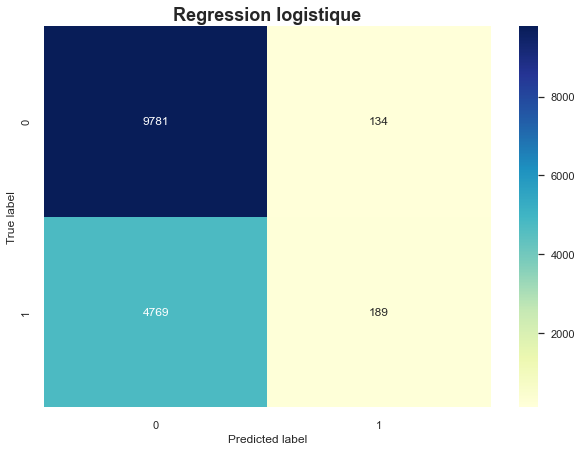

Regression logistique
---------------------
Errors :
 * accuracy = 0.6703422308881867
 * recall = 0.038120209762000805
 * precision = 0.5851393188854489
 * f1 = 0.07157735277409581
 * roc_score = 0.5123026666560886, 
 * perso_score = 0.0327148043565954




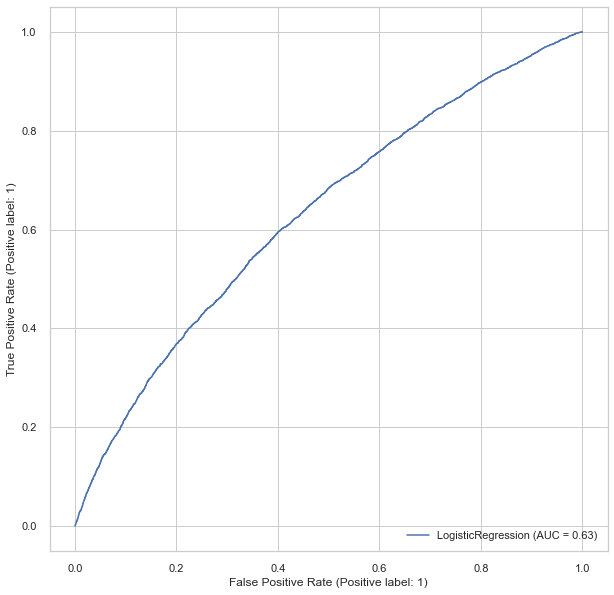

------------------------------------------------------------------------------------------------------------------------------------------------------
Le temps d'exécution du modèle XGBoost est de : 5.78 s
[[8709 1206]
 [3173 1785]]


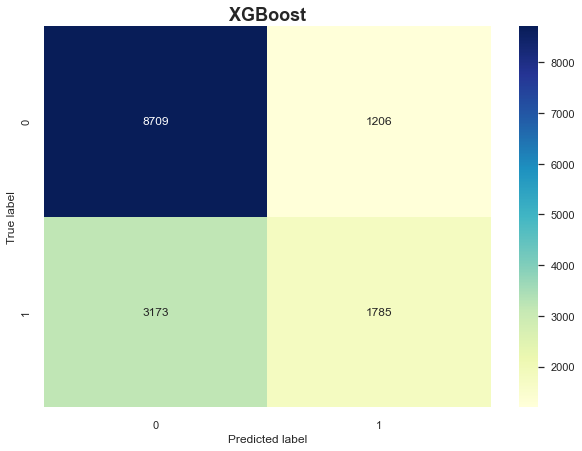

XGBoost
-------
Errors :
 * accuracy = 0.7055738586700733
 * recall = 0.3600242033077854
 * precision = 0.59679037111334
 * f1 = 0.44911309598691657
 * roc_score = 0.619195157629687, 
 * perso_score = 0.31137555465913674




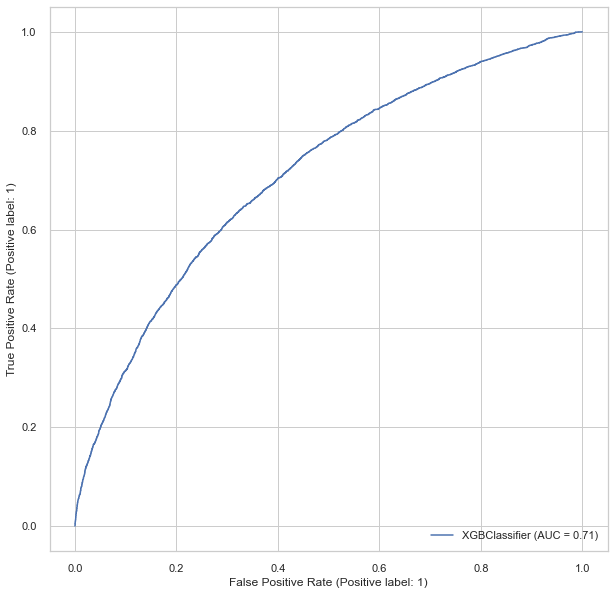

------------------------------------------------------------------------------------------------------------------------------------------------------
Le temps d'exécution du modèle LightGBM est de : 0.76 s
[[8881 1034]
 [3259 1699]]


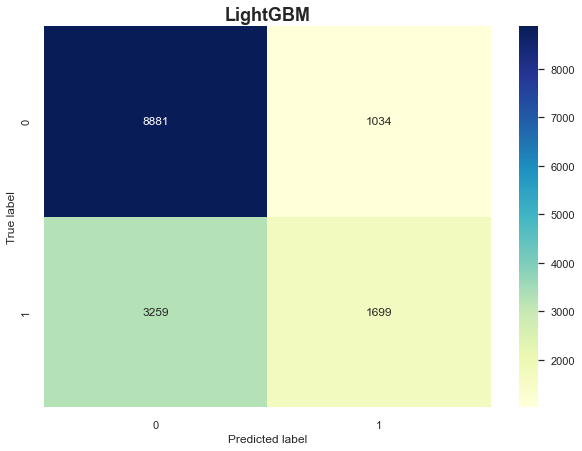

LightGBM
--------
Errors :
 * accuracy = 0.7113561487258792
 * recall = 0.3426784993949173
 * precision = 0.6216611781924625
 * f1 = 0.44181510856845657
 * roc_score = 0.6191960323500053, 
 * perso_score = 0.3009681323114159




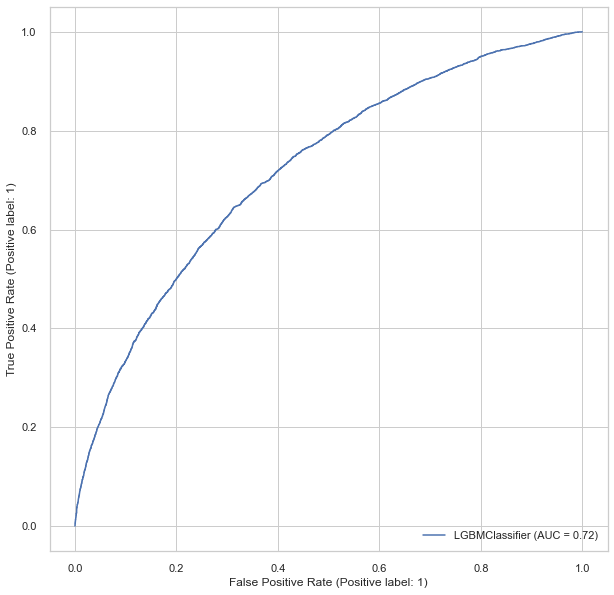

------------------------------------------------------------------------------------------------------------------------------------------------------
Le temps d'exécution du modèle knn est de : 15.95 s
[[7809 2106]
 [3413 1545]]


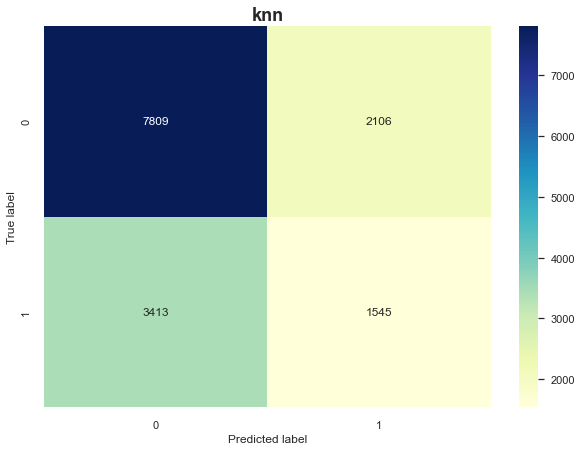

knn
---
Errors :
 * accuracy = 0.6289248974652054
 * recall = 0.3116175877369907
 * precision = 0.4231717337715694
 * f1 = 0.3589267046114531
 * roc_score = 0.5496060707217479, 
 * perso_score = 0.22666397741024608




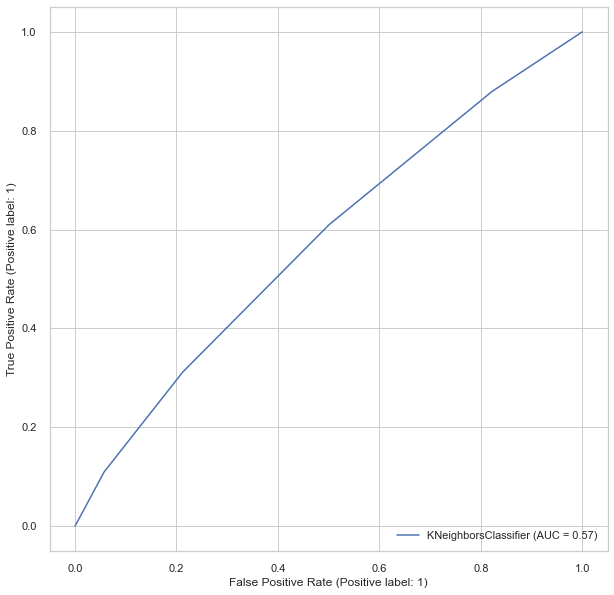

------------------------------------------------------------------------------------------------------------------------------------------------------


In [61]:
for model, reg in dict_models.items():
    testModel(model, reg, dict_predictions_baseModel, X_train_w, y_train_w, X_test_w, y_test_w)

A nouveau, XGBoost est l'algorithme qui a les meilleurs score, mais ces scores sont extrèmement proches avec ceux après nettoyage des NaNs

Nous allons donc garder le dataset nettoyé et rechercher les hyperparamètres pour LightGBM et Xgboost

## Recherche d'hyperparamètres

### LightGBM

In [64]:
parameters_light = [{'subsample' : [0.1, 0.5, 1], 'num_leaves': [5, 20, 31, 50], 'min_child_weight' : [0.00001, 0.001, 0.1, 1, 10], 'min_child_samples' : [5, 20, 100, 500], 'colsample_bytree' : [0.1, 0.5, 1], 'max_depth' : [-1, 10, 50, 200]}]

In [67]:
custom_scorer = make_scorer(persoMetric)

In [81]:
grid_search_lightGBM = GridSearchCV(LGBMClassifier(random_state=42, objective='binary'), parameters_light, cv=10, scoring=custom_scorer, verbose=2, return_train_score = True)

In [82]:
res_lightGBM = grid_search_lightGBM.fit(X_train, y_train) 

Fitting 10 folds for each of 2880 candidates, totalling 28800 fits
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.5s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.5s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.5s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.5s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.5s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.5s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, s

In [83]:
best_params_lightGBM = res_lightGBM.best_params_

In [84]:
best_params_lightGBM

{'colsample_bytree': 1,
 'max_depth': -1,
 'min_child_samples': 500,
 'min_child_weight': 1e-05,
 'num_leaves': 50,
 'subsample': 0.1}

---

In [65]:
custom_scorer2 = make_scorer(persoMetric2)

In [68]:
grid_search_lightGBM2 = GridSearchCV(LGBMClassifier(random_state=42, objective='binary'), parameters_light, cv=10, scoring=custom_scorer, verbose=2, return_train_score = True)

In [69]:
res_lightGBM2 = grid_search_lightGBM2.fit(X_train, y_train) 

Fitting 10 folds for each of 2880 candidates, totalling 28800 fits
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.4s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.4s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.4s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.4s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.4s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, subsample=0.1; total time=   0.4s
[CV] END colsample_bytree=0.1, max_depth=-1, min_child_samples=5, min_child_weight=1e-05, num_leaves=5, s

In [70]:
best_params_lightGBM2 = res_lightGBM2.best_params_

In [71]:
best_params_lightGBM2

{'colsample_bytree': 1,
 'max_depth': -1,
 'min_child_samples': 500,
 'min_child_weight': 1e-05,
 'num_leaves': 50,
 'subsample': 0.1}

Les hyperparamètres sont les mêmes que ce soit avec -10 ou -5 dans notre métrique perso.

#### Application de ces hyperparamètres

In [95]:
light_with_h = LGBMClassifier(random_state=42, subsample=0.1 , num_leaves=50, min_child_weight=0.00001, min_child_samples=500, colsample_bytree=1, max_depth= -1, objective='binary')

In [96]:
start_time = time.time()
light_fit = light_with_h.fit(X_train, y_train)
print('Le temps d\'exécution pour l\'entraînement du modèle LightGBM est de : {} s'.format(round(time.time()-start_time, 2)))

Le temps d'exécution pour l'entraînement du modèle LightGBM est de : 0.85 s


In [97]:
y_pred_h_light_bin = light_with_h.predict(X_test) #avec 0 ou 1

In [98]:
y_pred_h_light_prob = light_with_h.predict_proba(X_test) #avec pourcentage

Errors :
 * accuracy = 0.7132387547905601
 * recall = 0.35941912061315046
 * precision = 0.6206896551724138
 * f1 = 0.4552305530719121
 * roc_score = 0.6247927675682999, 
 * perso_score = 0.3154901169826543


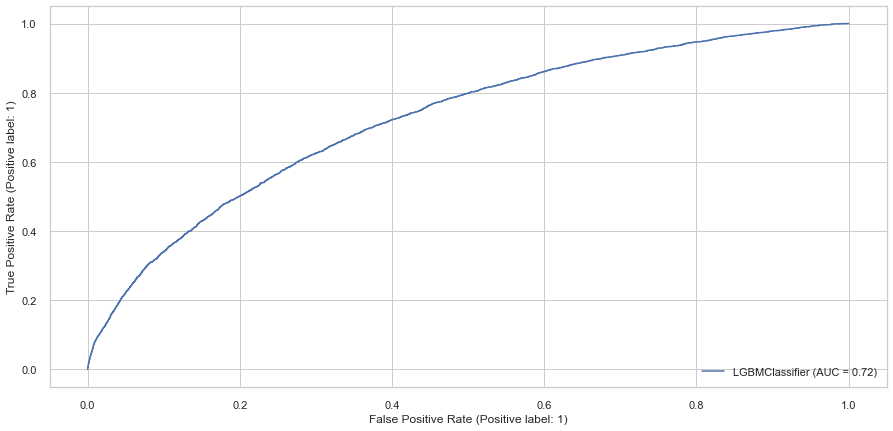

In [99]:
accuracy = accuracy_score(y_test, y_pred_h_light_bin)
recall = recall_score(y_test, y_pred_h_light_bin)
precision = precision_score(y_test, y_pred_h_light_bin)
f1 = f1_score(y_test, y_pred_h_light_bin)
roc = roc_auc_score(y_test, y_pred_h_light_bin)
perso = persoMetric(y_test, y_pred_h_light_bin)
print('Errors :\n * accuracy = {}\n * recall = {}\n * precision = {}\n * f1 = {}\n * roc_score = {}, \n * perso_score = {}'.format(accuracy, recall, precision, f1, roc, perso))
roc_c = RocCurveDisplay.from_estimator(light_fit, X_test, y_test)

[[8826 1089]
 [3176 1782]]


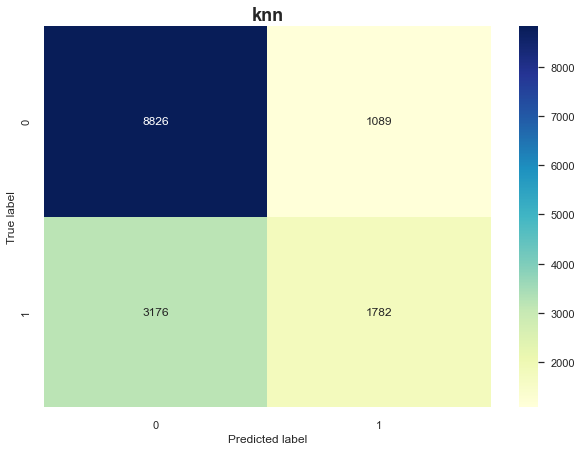

In [100]:
conf_matrix_h = confusion_matrix(y_test, y_pred_h_light_bin)
print(conf_matrix_h)
f,ax=plt.subplots(figsize=(10,7))
_=sns.heatmap(conf_matrix_h, cmap='YlGnBu', annot=True, fmt="d")
_=plt.title(model, weight='bold', fontsize=18)
_=plt.ylabel('True label')
_=plt.xlabel('Predicted label')
plt.show()

Les hyperparamètres de LightGBM ne changent quasiment pas nos scores, nous allons donc nous interesser à XGBoost

### XGBoost

In [72]:
parameters = [{'subsample' : [0.1, 0.5, 0.75, 1], 'max_depth': [3, 6, 10, 20], 'min_child_weight' : [0, 5, 10], 'eta' : [0.05, 0.1, 0.3], 'scale_pos_weight' : [0, 5, 10, 20]}]

In [73]:
custom_scorer = make_scorer(persoMetric)

In [74]:
grid_search_xgboost = GridSearchCV(XGBClassifier(use_label_encoder=False, eval_metric = 'error', random_state = 42), parameters, cv=10, scoring=custom_scorer, verbose=2, return_train_score = True)

In [75]:
res_xgboost = grid_search_xgboost.fit(X_train, y_train) 

Fitting 10 folds for each of 576 candidates, totalling 5760 fits
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   2.2s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   2.1s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   2.2s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   2.3s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   2.1s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   2.2s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   2.2s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   2.2s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; 

In [76]:
best_params_xgboost = res_xgboost.best_params_

In [77]:
best_params_xgboost

{'eta': 0.05,
 'max_depth': 6,
 'min_child_weight': 10,
 'scale_pos_weight': 5,
 'subsample': 0.75}

---

In [78]:
custom_scorer2 = make_scorer(persoMetric2)

In [79]:
grid_search_xgboost2 = GridSearchCV(XGBClassifier(use_label_encoder=False, eval_metric = 'error', random_state = 42), parameters, cv=10, scoring=custom_scorer2, verbose=2, return_train_score = True)

In [80]:
res_xgboost2 = grid_search_xgboost2.fit(X_train, y_train) 

Fitting 10 folds for each of 576 candidates, totalling 5760 fits
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   1.4s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   1.5s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   1.4s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   1.4s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   1.4s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   1.4s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   1.3s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; total time=   1.4s
[CV] END eta=0.05, max_depth=3, min_child_weight=0, scale_pos_weight=0, subsample=0.1; 

In [81]:
best_params_xgboost2 = res_xgboost2.best_params_

In [82]:
best_params_xgboost2

{'eta': 0.1,
 'max_depth': 3,
 'min_child_weight': 5,
 'scale_pos_weight': 10,
 'subsample': 1}

{'eta': 0.1,
 'max_depth': 3,
 'min_child_weight': 0,
 'scale_pos_weight': 10,
 'subsample': 1}

{'eta': 0.3,
 'max_depth': 3,
 'min_child_weight': 10,
 'scale_pos_weight': 5,
 'subsample': 1} 
 error -5
 

#### Application de ces hyperparamètres

* Avec -10 dans notre metrique perso :

In [83]:
xgb_with_h_10 = XGBClassifier(use_label_encoder=False, eval_metric = 'error', eta=0.1, max_depth=3, min_child_weight=5, scale_pos_weight=10, subsample=1, random_state = 42)

In [84]:
start_time = time.time()
xgb_fit_10 = xgb_with_h_10.fit(X_train, y_train)
print('Le temps d\'exécution pour l\'entraînement du modèle XGBoost est de : {} s'.format(round(time.time()-start_time, 2)))

Le temps d'exécution pour l'entraînement du modèle XGBoost est de : 2.92 s


In [85]:
y_pred_h_xgb_bin_10 = xgb_with_h_10.predict(X_test) #avec 0 ou 1

In [86]:
y_pred_h_xgb_prob_10 = xgb_with_h_10.predict_proba(X_test) #avec pourcentage

Errors :
 * accuracy = 0.35258522154239225
 * recall = 0.9939491730536507
 * precision = 0.3392303985681834
 * f1 = 0.5058249935848087
 * roc_score = 0.5129100378631845, 
 * perso_score = 0.6067365873336023


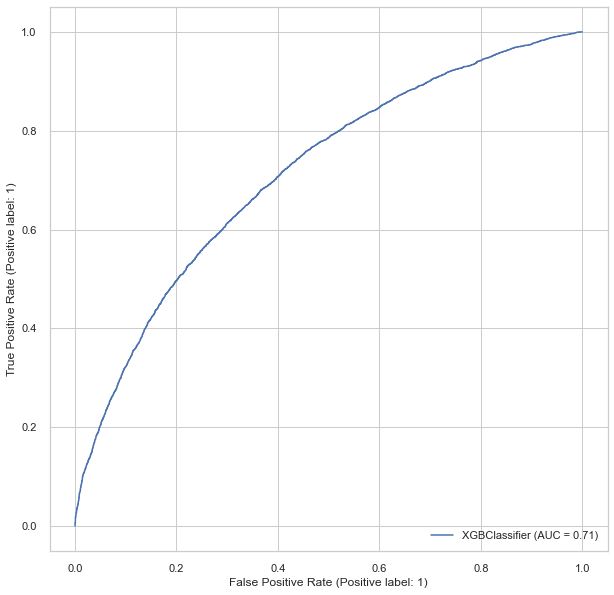

In [87]:
accuracy = accuracy_score(y_test, y_pred_h_xgb_bin_10)
recall = recall_score(y_test, y_pred_h_xgb_bin_10)
precision = precision_score(y_test, y_pred_h_xgb_bin_10)
f1 = f1_score(y_test, y_pred_h_xgb_bin_10)
roc = roc_auc_score(y_test, y_pred_h_xgb_bin_10)
perso = persoMetric(y_test, y_pred_h_xgb_bin_10)
print('Errors :\n * accuracy = {}\n * recall = {}\n * precision = {}\n * f1 = {}\n * roc_score = {}, \n * perso_score = {}'.format(accuracy, recall, precision, f1, roc, perso))
f,ax=plt.subplots(figsize=(10,10))
roc_c = RocCurveDisplay.from_estimator(xgb_fit_10, X_test, y_test, ax=ax)
plt.show()

[[ 316 9599]
 [  30 4928]]


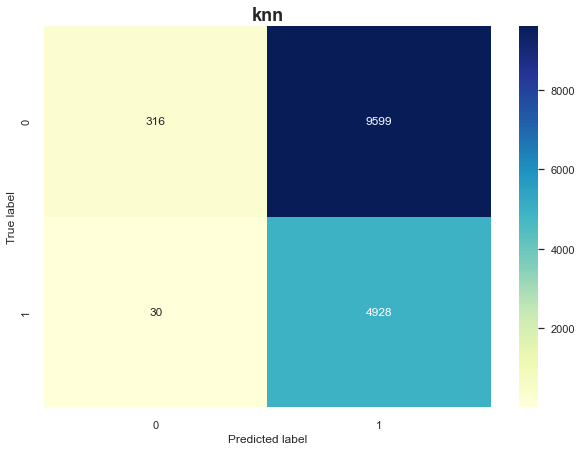

In [88]:
conf_matrix_h = confusion_matrix(y_test, y_pred_h_xgb_bin_10)
print(conf_matrix_h)
f,ax=plt.subplots(figsize=(10,7))
_=sns.heatmap(conf_matrix_h, cmap='YlGnBu', annot=True, fmt="d")
_=plt.title(model, weight='bold', fontsize=18)
_=plt.ylabel('True label')
_=plt.xlabel('Predicted label')
plt.show()

* Avec -5 dans notre metrique perso :

In [89]:
xgb_with_h = XGBClassifier(use_label_encoder=False, eval_metric = 'error', eta=0.05, max_depth=6, min_child_weight=10, scale_pos_weight=5, subsample=0.72, random_state = 42)

In [90]:
start_time = time.time()
xgb_fit = xgb_with_h.fit(X_train, y_train)
print('Le temps d\'exécution pour l\'entraînement du modèle XGBoost est de : {} s'.format(round(time.time()-start_time, 2)))

Le temps d'exécution pour l'entraînement du modèle XGBoost est de : 6.82 s


In [91]:
y_pred_h_xgb_bin = xgb_with_h.predict(X_test) #avec 0 ou 1

In [92]:
y_pred_h_xgb_prob = xgb_with_h.predict_proba(X_test)#avec pourcentage

Errors :
 * accuracy = 0.4631210919115175
 * recall = 0.926784993949173
 * precision = 0.37611524924285833
 * f1 = 0.535080058224163
 * roc_score = 0.5790253764501286, 
 * perso_score = 0.6193223073820089


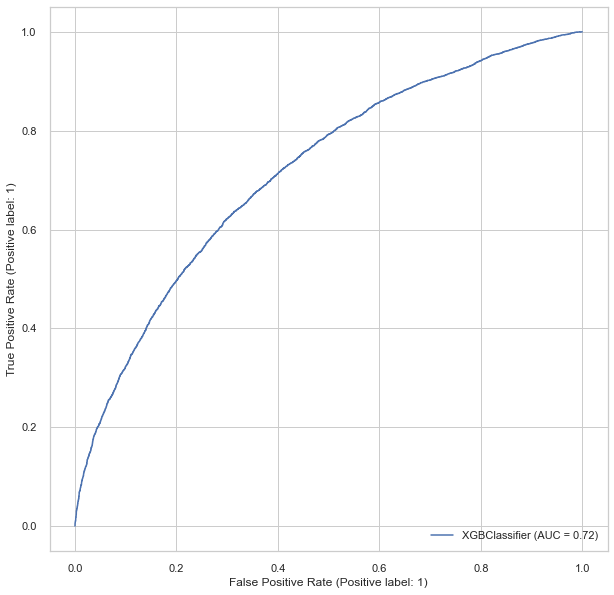

In [93]:
accuracy = accuracy_score(y_test, y_pred_h_xgb_bin)
recall = recall_score(y_test, y_pred_h_xgb_bin)
precision = precision_score(y_test, y_pred_h_xgb_bin)
f1 = f1_score(y_test, y_pred_h_xgb_bin)
roc = roc_auc_score(y_test, y_pred_h_xgb_bin)
perso = persoMetric(y_test, y_pred_h_xgb_bin)
print('Errors :\n * accuracy = {}\n * recall = {}\n * precision = {}\n * f1 = {}\n * roc_score = {}, \n * perso_score = {}'.format(accuracy, recall, precision, f1, roc, perso))
f,ax=plt.subplots(figsize=(10,10))
roc_c = RocCurveDisplay.from_estimator(xgb_fit, X_test, y_test, ax=ax)
plt.show()

[[2293 7622]
 [ 363 4595]]


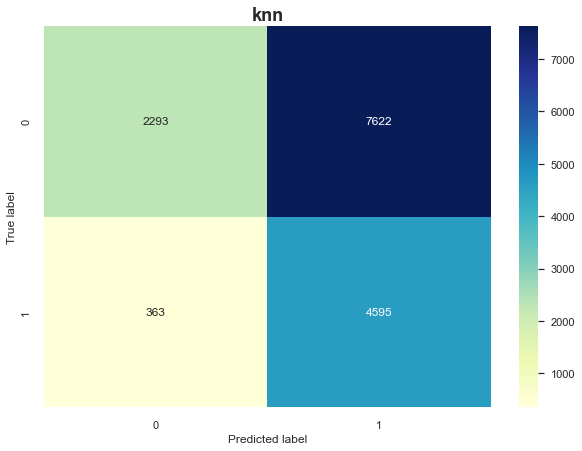

In [94]:
conf_matrix_h = confusion_matrix(y_test, y_pred_h_xgb_bin)
print(conf_matrix_h)
f,ax=plt.subplots(figsize=(10,7))
_=sns.heatmap(conf_matrix_h, cmap='YlGnBu', annot=True, fmt="d")
_=plt.title(model, weight='bold', fontsize=18)
_=plt.ylabel('True label')
_=plt.xlabel('Predicted label')
plt.show()

* Nous obtenons une réelle améliorations de nos scores avec les hyperparamètres de XGBoost, nous allons donc garder cet algorithme pour la suite du projet
* De plus, les résultats sont meilleurs avec une métrique perso reglée sur -5, nous allons donc garder cette valeur

#### Predictions selon l'individu

In [101]:
for i in range(len(X_test)):
	print("X=%s, Predicted=%s" % (X_test.index[i], y_pred_h_xgb_prob[i]))

X=44724, Predicted=[0.37703198 0.622968  ]
X=58968, Predicted=[0.59289914 0.40710086]
X=58104, Predicted=[0.2046367 0.7953633]
X=58289, Predicted=[0.6092848  0.39071518]
X=22223, Predicted=[0.23299813 0.76700187]
X=1961, Predicted=[0.4304474 0.5695526]
X=11258, Predicted=[0.5542903 0.4457097]
X=58361, Predicted=[0.42813808 0.5718619 ]
X=38890, Predicted=[0.15850085 0.84149915]
X=16725, Predicted=[0.2633559 0.7366441]
X=42584, Predicted=[0.48922664 0.51077336]
X=25525, Predicted=[0.2994073 0.7005927]
X=21188, Predicted=[0.30933744 0.69066256]
X=24327, Predicted=[0.35170138 0.6482986 ]
X=15152, Predicted=[0.4144026 0.5855974]
X=50642, Predicted=[0.25337017 0.74662983]
X=27454, Predicted=[0.11623234 0.88376766]
X=4627, Predicted=[0.4957835 0.5042165]
X=50130, Predicted=[0.19018298 0.809817  ]
X=56666, Predicted=[0.11390352 0.8860965 ]
X=35548, Predicted=[0.30598056 0.69401944]
X=34249, Predicted=[0.3481893 0.6518107]
X=70714, Predicted=[0.13237023 0.86762977]
X=65531, Predicted=[0.477683 

In [102]:
for i in range(len(X_test)):
	print("X=%s, Predicted=%s" % (X_test.index[i], y_pred_h_xgb_bin[i])) #premiere valeur 0, seconde valeur 1

X=44724, Predicted=1
X=58968, Predicted=0
X=58104, Predicted=1
X=58289, Predicted=0
X=22223, Predicted=1
X=1961, Predicted=1
X=11258, Predicted=0
X=58361, Predicted=1
X=38890, Predicted=1
X=16725, Predicted=1
X=42584, Predicted=1
X=25525, Predicted=1
X=21188, Predicted=1
X=24327, Predicted=1
X=15152, Predicted=1
X=50642, Predicted=1
X=27454, Predicted=1
X=4627, Predicted=1
X=50130, Predicted=1
X=56666, Predicted=1
X=35548, Predicted=1
X=34249, Predicted=1
X=70714, Predicted=1
X=65531, Predicted=1
X=1538, Predicted=1
X=19900, Predicted=1
X=2962, Predicted=0
X=36885, Predicted=1
X=35307, Predicted=1
X=74153, Predicted=1
X=2302, Predicted=1
X=5636, Predicted=1
X=14138, Predicted=1
X=70344, Predicted=1
X=34470, Predicted=0
X=14995, Predicted=1
X=58537, Predicted=1
X=65977, Predicted=1
X=53546, Predicted=1
X=48136, Predicted=1
X=12390, Predicted=1
X=51724, Predicted=1
X=13489, Predicted=1
X=22207, Predicted=1
X=45789, Predicted=1
X=31957, Predicted=0
X=70453, Predicted=0
X=46559, Predicted=

#### Feature importance

[0.00691269 0.00651114 0.01132259 0.01011598 0.01212953 0.00705557
 0.01209113 0.01601705 0.00719661 0.0105236  0.         0.00547485
 0.01071981 0.         0.00731575 0.00701968 0.00671522 0.00840237
 0.01184948 0.00655517 0.00342294 0.00766676 0.00764955 0.01068524
 0.00871003 0.00651861 0.05400174 0.00681002 0.01236425 0.00710226
 0.01564707 0.00876558 0.         0.01218731 0.         0.
 0.00509137 0.         0.00825758 0.         0.         0.01403753
 0.         0.01209237 0.         0.01323039 0.01203181 0.
 0.01182157 0.         0.         0.         0.         0.01060542
 0.00598181 0.00662776 0.00844542 0.0094021  0.01347722 0.
 0.01690233 0.01781933 0.         0.01458039 0.         0.00577596
 0.         0.         0.00441851 0.         0.00726278 0.
 0.00814614 0.00643294 0.         0.00688161 0.         0.01200123
 0.01056771 0.         0.         0.00868836 0.         0.02207361
 0.00715801 0.01140202 0.00996011 0.00772888 0.00878155 0.00524066
 0.00698065 0.         0.00

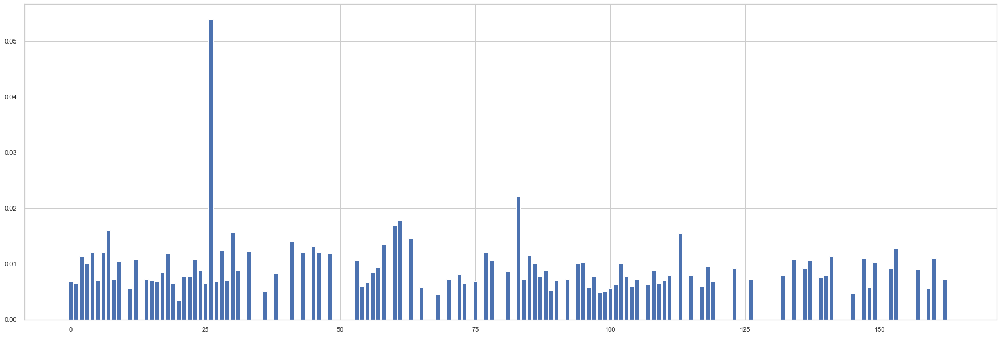

In [103]:
print(xgb_with_h.feature_importances_)
fig, ax = plt.subplots(figsize=(30,10))
_=plt.bar(range(len(xgb_with_h.feature_importances_)), xgb_with_h.feature_importances_)
plt.show()

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

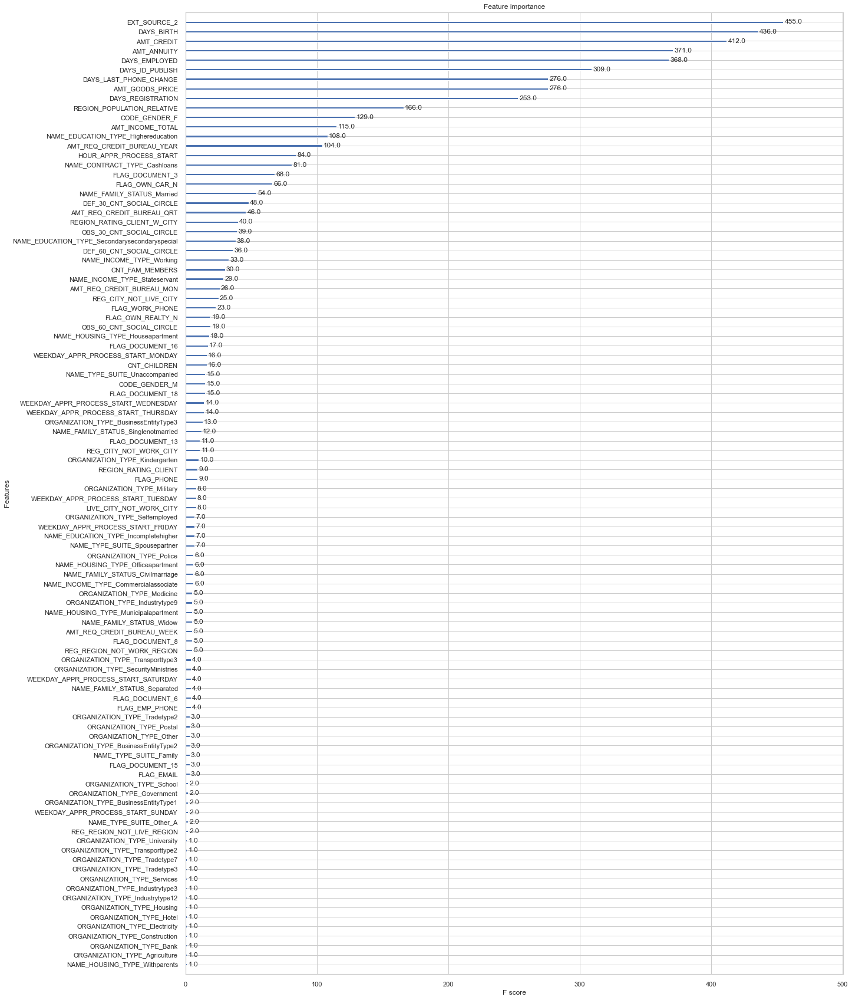

In [105]:
fig, ax = plt.subplots(figsize=(20,30))
plot_importance(xgb_with_h, grid=True, importance_type = 'weight', max_num_features=100, ax=ax)
_=plt.show()

Avec Shap :

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


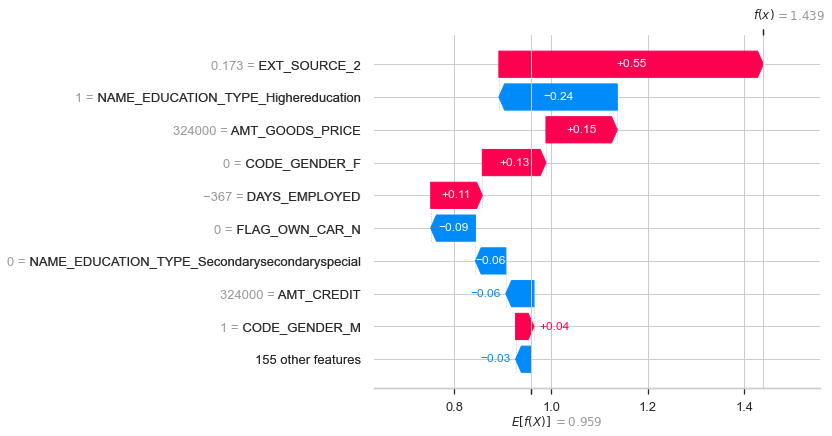

In [106]:
explainer = shap.TreeExplainer(xgb_with_h)
shap_values = explainer(X_train)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

In [108]:
shap.initjs()
shap.plots.force(shap_values[0])

### Exportations pour le dashboard

In [ ]:
filename = 'finalized_model.sav'
pickle.dump(xgb_with_h, open(filename, 'wb'))